# Running cellpose in colab with a GPU

(thanks to Matteo Carandini for setting this up)

UPDATED DEC 2020 for TORCH VERSION cellpose v0.6

## installation

Check CUDA version and GPU first

In [16]:
!nvcc --version
!nvidia-smi

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2019 NVIDIA Corporation
Built on Sun_Jul_28_19:07:16_PDT_2019
Cuda compilation tools, release 10.1, V10.1.243
Wed Dec 23 10:35:13 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.100      Driver Version: 440.100      CUDA Version: 10.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Quadro RTX 6000     Off  | 00000000:1A:00.0 Off |                  Off |
| 33%   30C    P8    16W / 260W |  12762MiB / 24220MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
|   1  Quadro RTX 8000     Off  | 00000000:67:00.0 Off |                  Off |
|

Install cellpose -- by default the torch GPU version is installed in COLAB notebook.

In [ ]:
#!pip install cellpose

import libraries and check GPU (the first time you import cellpose the models will download).

In [17]:
import numpy as np
import time, os, sys
from urllib.parse import urlparse
import skimage.io
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
mpl.rcParams['figure.dpi'] = 300

from urllib.parse import urlparse
from cellpose import models

use_GPU = models.use_gpu()
print('>>> GPU activated? %d'%use_GPU)


** TORCH CUDA version installed and working. **
>>> GPU activated? 1


Download sample images

Downloading: "http://www.cellpose.org/static/images/img02.png" to data/img02.png
100%|██████████| 131k/131k [00:00<00:00, 410kB/s] 
Downloading: "http://www.cellpose.org/static/images/img03.png" to data/img03.png
100%|██████████| 135k/135k [00:00<00:00, 424kB/s] 
Downloading: "http://www.cellpose.org/static/images/img05.png" to data/img05.png
100%|██████████| 180k/180k [00:00<00:00, 508kB/s] 
Downloading: "http://www.cellpose.org/static/data/rgb_3D.tif" to data/rgb_3D.tif
100%|██████████| 1.63M/1.63M [00:00<00:00, 2.00MB/s]


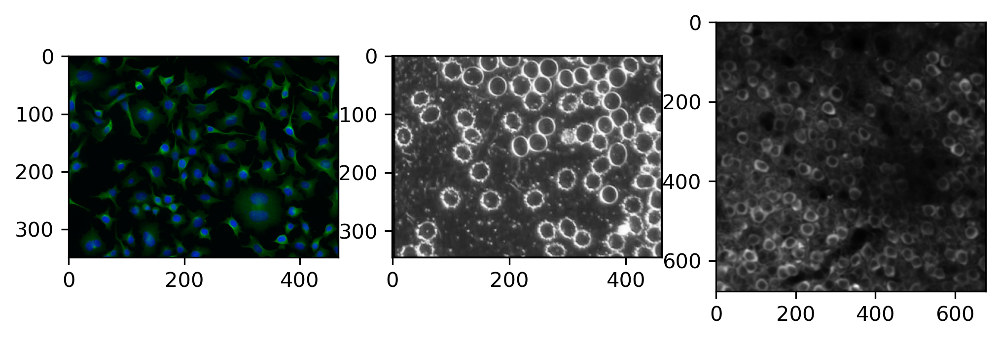

In [5]:
from cellpose import utils
# I will download images from website
urls = ['http://www.cellpose.org/static/images/img02.png',
        'http://www.cellpose.org/static/images/img03.png',
        'http://www.cellpose.org/static/images/img05.png',
        'http://www.cellpose.org/static/data/rgb_3D.tif']
files = []
for url in urls:
    parts = urlparse(url)
    filename = os.path.join("data", os.path.basename(parts.path))
    if not os.path.exists(filename):
        sys.stderr.write('Downloading: "{}" to {}\n'.format(url, filename))
        utils.download_url_to_file(url, filename)
    files.append(filename)

# REPLACE FILES WITH YOUR IMAGE PATHS
# files = ['img0.tif', 'img1.tif']
    
imgs = [skimage.io.imread(f) for f in files]
nimg = len(imgs)

plt.figure(figsize=(8,4))
for k,img in enumerate(imgs[:-1]):
  plt.subplot(1,3,k+1)
  plt.imshow(img)


## run cellpose on 2D sample images

(exclude last image)

In [6]:
# RUN CELLPOSE

imgs_2D = imgs[:-1]

from cellpose import models

# DEFINE CELLPOSE MODEL
# model_type='cyto' or model_type='nuclei'
model = models.Cellpose(gpu=use_GPU, model_type='cyto')

# define CHANNELS to run segementation on
# grayscale=0, R=1, G=2, B=3
# channels = [cytoplasm, nucleus]
# if NUCLEUS channel does not exist, set the second channel to 0
# channels = [0,0]
# IF ALL YOUR IMAGES ARE THE SAME TYPE, you can give a list with 2 elements
# channels = [0,0] # IF YOU HAVE GRAYSCALE
# channels = [2,3] # IF YOU HAVE G=cytoplasm and B=nucleus
# channels = [2,1] # IF YOU HAVE G=cytoplasm and R=nucleus

# or if you have different types of channels in each image
channels = [[2,3], [0,0], [0,0]]

# if diameter is set to None, the size of the cells is estimated on a per image basis
# you can set the average cell `diameter` in pixels yourself (recommended) 
# diameter can be a list or a single number for all images

masks, flows, styles, diams = model.eval(imgs_2D, diameter=None, flow_threshold=None, channels=channels)

  0%|          | 0/3 [00:00<?, ?it/s]

** TORCH CUDA version installed and working. **
>>>> using GPU
processing 3 image(s)
computing styles from images


  0%|          | 0/3 [00:00<?, ?it/s]

time spent: running network 0.23s; flow+mask computation 2.40
estimated cell diameters for 3 image(s) in 2.94 sec
>>> diameter(s) =  [29.38115358 33.17679957 30.58094729]


100%|██████████| 3/3 [00:01<00:00,  1.54it/s]

time spent: running network 1.16s; flow+mask computation 0.78
estimated masks for 3 image(s) in 1.97 sec
>>>> TOTAL TIME 4.92 sec


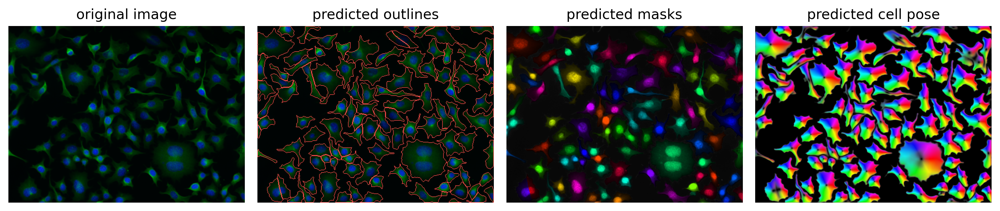

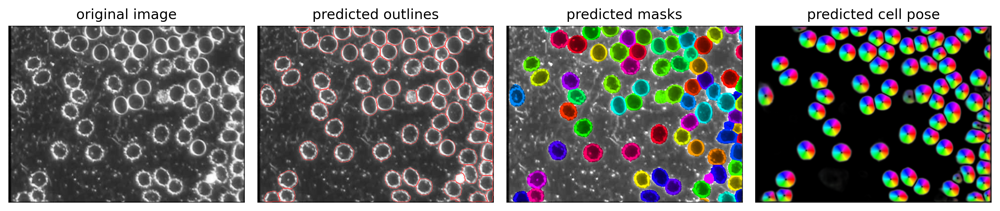

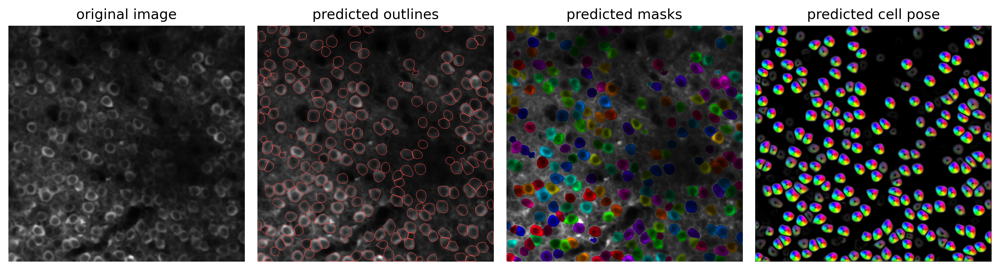

In [7]:
# DISPLAY RESULTS
from cellpose import plot

nimg = len(imgs_2D)
for idx in range(nimg):
    maski = masks[idx]
    flowi = flows[idx][0]

    fig = plt.figure(figsize=(12,5))
    plot.show_segmentation(fig, imgs[idx], maski, flowi, channels=channels[idx])
    plt.tight_layout()
    plt.show()

## save output to *_seg.npy

you will see the files save in the Files tab and you can download them from there

In [ ]:
from cellpose import io

io.masks_flows_to_seg(imgs_2D, masks, flows, diams, files, channels)

## run cellpose 3D

In [ ]:
# test 3D stack

img_3D = imgs[-1]
# with 3D you have to set the diameter manually (no auto detect)
masks, flows, styles, diams = model.eval(img_3D, channels=[2,1], diameter=25, do_3D=True)

In [ ]:
# DISPLAY RESULTS
plt.figure(figsize=(15,3))
for i,iplane in enumerate(np.arange(0,75,10,int)):
  img0 = plot.image_to_rgb(img_3D[iplane, [1,0]].copy(), channels=[2,3])
  plt.subplot(1,8,i+1)
  outlines = utils.masks_to_outlines(masks[iplane])
  outX, outY = np.nonzero(outlines)
  imgout= img0.copy()
  imgout[outX, outY] = np.array([255,75,75])
  plt.imshow(imgout)
  plt.title('iplane = %d'%iplane)

## run covid plate

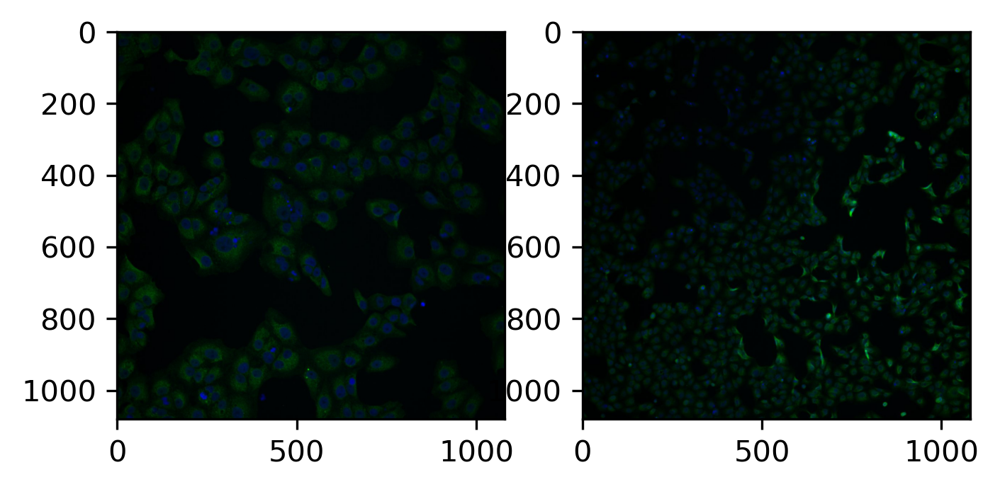

In [18]:
import imageio
covid_imgs = ['data/20x.jpg', 'data/10x.jpg']
imgs = [skimage.io.imread(f) for f in covid_imgs]
nimg = len(imgs)

plt.figure(figsize=(8,4))
for k,img in enumerate(imgs):
  plt.subplot(1,3,k+1)
  plt.imshow(img)

In [19]:
type(imgs[0])

numpy.ndarray

In [9]:
model = models.Cellpose(gpu=use_GPU, model_type='cyto')

** TORCH CUDA version installed and working. **
>>>> using GPU


In [14]:
channels = [[2,3], [2,3]]
masks, flows, styles, diams = model.eval(imgs, diameter=None, flow_threshold=None, channels=channels)

  0%|          | 0/2 [00:00<?, ?it/s]

processing 2 image(s)
computing styles from images


  0%|          | 0/2 [00:00<?, ?it/s]

time spent: running network 0.50s; flow+mask computation 14.68
estimated cell diameters for 2 image(s) in 16.11 sec
>>> diameter(s) =  [51.13928462 23.84326485]


/home/haoxu/miniconda3/envs/cellpose_torch/lib/python3.7/site-packages/torch/nn/functional.py:3385: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn("Default grid_sample and affine_grid behavior has changed "
100%|██████████| 2/2 [00:06<00:00,  3.12s/it]

time spent: running network 2.34s; flow+mask computation 3.88
estimated masks for 2 image(s) in 6.32 sec
>>>> TOTAL TIME 22.43 sec


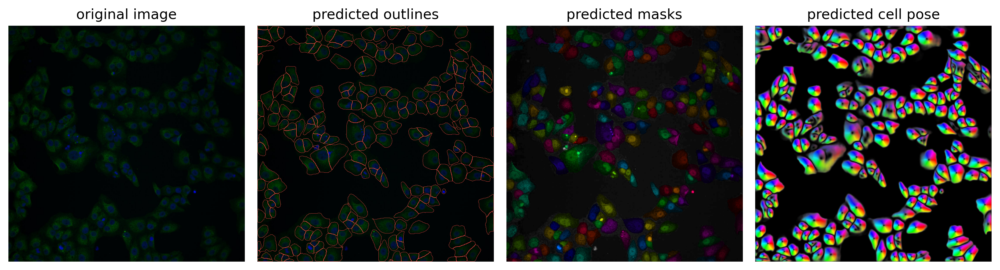

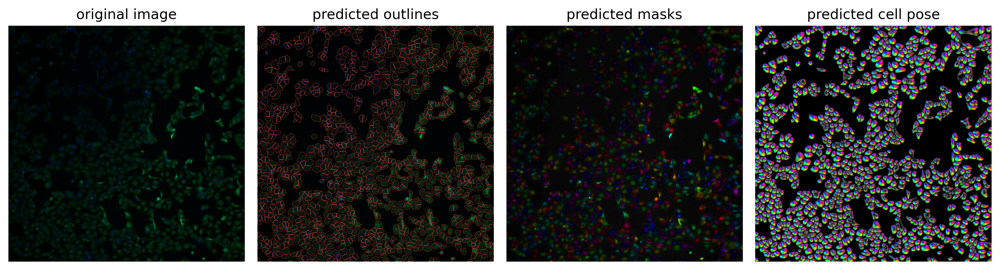

In [15]:
# DISPLAY RESULTS
from cellpose import plot

nimg = len(imgs)
for idx in range(nimg):
    maski = masks[idx]
    flowi = flows[idx][0]

    fig = plt.figure(figsize=(12,5))
    plot.show_segmentation(fig, imgs[idx], maski, flowi, channels=channels[idx])
    plt.tight_layout()
    plt.show()